In [113]:
# Importing libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
import gymnasium as gym
import matplotlib.pyplot as plt
import pandas as pd

In [135]:
# defining the DQN

HIDDEN_DIM = 100
class DQN(nn.Module):
  def __init__(self , state_dim = 4 , action_dim = 2):
    super().__init__()
    self.ffn = nn.Sequential(

        nn.Linear(state_dim , HIDDEN_DIM),
        nn.ReLU(),
        nn.Linear(HIDDEN_DIM , HIDDEN_DIM),
        nn.ReLU(),
        nn.Linear(HIDDEN_DIM , action_dim)

    )

  def forward(self , x):
    return self.ffn(x)



In [136]:
class ReplayBuffer:
  def __init__(self , max_size = 1000):
    super().__init__()
    self. capacity = max_size
    self.storage = []
    self.position = 0

  def add(self , state , action , reward , next_state , done):
    transition = (state , action , reward , next_state , done)

    if len(self.storage) < self.capacity :
      self.storage.append(transition)
    else :
      self.storage[self.position]  = transition

    self.position = (self.position + 1) % self.capacity

  def sample(self, batch_size):
      # 1. Pick random indices
      ix = torch.randint(0, len(self.storage), (batch_size,))

      # 2. Gather transitions
      mini_batch = [self.storage[i] for i in ix]

      # 3. Unzip into components
      states, actions, rewards, next_states, dones = zip(*mini_batch)

      # 4. Convert to tensors with correct shapes & dtypes
      states      = torch.stack([torch.tensor(s, dtype=torch.float32) for s in states])
      actions     = torch.tensor(actions, dtype=torch.long)
      rewards     = torch.tensor(rewards, dtype=torch.float32)
      next_states = torch.stack([torch.tensor(s, dtype=torch.float32) for s in next_states])
      dones       = torch.tensor(dones, dtype=torch.float32)

      return states, actions, rewards, next_states, dones
  def __len__(self):
    return len(self.storage)


In [137]:
capacity = 10000
lr =1e-3
episodes = 1000
max_episode_len = 200
min_threshold = 1000
gamma = 0.99
batch_size = 64
epsilon_decay = 0.995
epsilon_min = 0.05
tau = 0.005

# Initializing Environment , Q-net , Target-net , Replay buffer and optimizer
env = gym.make("CartPole-v1", render_mode="rgb_array")
state_dim = env.observation_space.shape[0]
action_dim = env.action_space.n
state = env.reset()


q_net = DQN(state_dim , action_dim)
target_net = DQN(state_dim , action_dim)
target_net.load_state_dict(q_net.state_dict()) # Initalizing networks with exactly same weights



buffer = ReplayBuffer(max_size=capacity)


optimizer = torch.optim.Adam(q_net.parameters() , lr = lr)


Episode 1 | Epsilon 1.000 | Reward 24.0
Episode 2 | Epsilon 0.995 | Reward 20.0
Episode 3 | Epsilon 0.990 | Reward 32.0
Episode 4 | Epsilon 0.985 | Reward 12.0
Episode 5 | Epsilon 0.980 | Reward 22.0
Episode 6 | Epsilon 0.975 | Reward 27.0
Episode 7 | Epsilon 0.970 | Reward 10.0
Episode 8 | Epsilon 0.966 | Reward 39.0
Episode 9 | Epsilon 0.961 | Reward 34.0
Episode 10 | Epsilon 0.956 | Reward 21.0
Episode 11 | Epsilon 0.951 | Reward 16.0
Episode 12 | Epsilon 0.946 | Reward 21.0
Episode 13 | Epsilon 0.942 | Reward 13.0
Episode 14 | Epsilon 0.937 | Reward 10.0
Episode 15 | Epsilon 0.932 | Reward 28.0
Episode 16 | Epsilon 0.928 | Reward 10.0
Episode 17 | Epsilon 0.923 | Reward 19.0
Episode 18 | Epsilon 0.918 | Reward 39.0
Episode 19 | Epsilon 0.914 | Reward 14.0
Episode 20 | Epsilon 0.909 | Reward 16.0
Episode 21 | Epsilon 0.905 | Reward 25.0
Episode 22 | Epsilon 0.900 | Reward 16.0
Episode 23 | Epsilon 0.896 | Reward 57.0
Episode 24 | Epsilon 0.891 | Reward 13.0
Episode 25 | Epsilon 0.88

/tmp/ipython-input-1995266492.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  states      = torch.stack([torch.tensor(s, dtype=torch.float32) for s in states])
/tmp/ipython-input-1995266492.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  next_states = torch.stack([torch.tensor(s, dtype=torch.float32) for s in next_states])


Episode 40 | Epsilon 0.822 | Reward 64.0
Episode 41 | Epsilon 0.818 | Reward 21.0
Episode 42 | Epsilon 0.814 | Reward 10.0
Episode 43 | Epsilon 0.810 | Reward 11.0
Episode 44 | Epsilon 0.806 | Reward 16.0
Episode 45 | Epsilon 0.802 | Reward 19.0
Episode 46 | Epsilon 0.798 | Reward 30.0
Episode 47 | Epsilon 0.794 | Reward 12.0
Episode 48 | Epsilon 0.790 | Reward 19.0
Episode 49 | Epsilon 0.786 | Reward 18.0
Episode 50 | Epsilon 0.782 | Reward 12.0
Episode 51 | Epsilon 0.778 | Reward 10.0
Episode 52 | Epsilon 0.774 | Reward 11.0
Episode 53 | Epsilon 0.771 | Reward 9.0
Episode 54 | Epsilon 0.767 | Reward 19.0
Episode 55 | Epsilon 0.763 | Reward 12.0
Episode 56 | Epsilon 0.759 | Reward 22.0
Episode 57 | Epsilon 0.755 | Reward 17.0
Episode 58 | Epsilon 0.751 | Reward 21.0
Episode 59 | Epsilon 0.748 | Reward 15.0
Episode 60 | Epsilon 0.744 | Reward 17.0
Episode 61 | Epsilon 0.740 | Reward 10.0
Episode 62 | Epsilon 0.737 | Reward 18.0
Episode 63 | Epsilon 0.733 | Reward 33.0
Episode 64 | Epsi

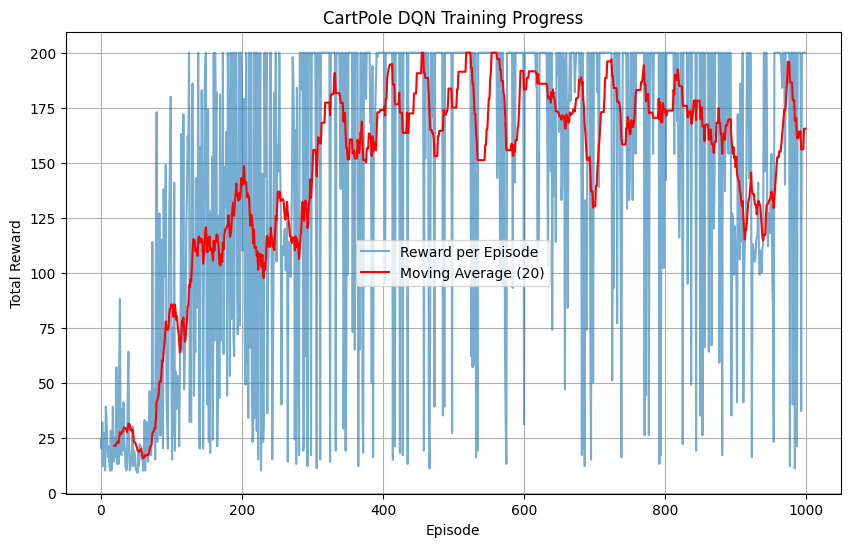

In [138]:
epsilon = 1# This lets the agent fully explore the env initially
total_rewards_in_episodes = []

for episode in range(episodes):
    # Reset environment
    state, info = env.reset()
    state = torch.as_tensor(state, dtype=torch.float32)

    total_reward = 0

    for step in range(max_episode_len):
        # Epsilon-greedy action selection
        if torch.rand(1).item() < epsilon:
            action = env.action_space.sample()
        else:
            q_values = q_net(state.unsqueeze(0))  # add batch dimension
            action = q_values.argmax(-1).item()

        # Step environment
        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated
        next_state = torch.as_tensor(next_state, dtype=torch.float32)

        # Store transition
        buffer.add(state, action, reward, next_state, done)
        total_reward += reward

        # Train if buffer is ready
        if len(buffer) >= min_threshold:
            s_b, a_b, r_b, n_s_b, d_b = buffer.sample(batch_size)

            preds = q_net(s_b)[torch.arange(0, s_b.shape[0]), a_b]
            with torch.no_grad():
                y = r_b + gamma * target_net(n_s_b).max(-1)[0] * (1 - d_b)
            loss = F.mse_loss(preds, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        state = next_state
        if done:
            break

    # Episode bookkeeping
    print(f"Episode {episode+1} | Epsilon {epsilon:.3f} | Reward {total_reward}")
    epsilon = max(epsilon_min, epsilon * epsilon_decay)
    total_rewards_in_episodes.append(total_reward)

    # Soft update target net every episode
    with torch.no_grad():
        for p1, p2 in zip(q_net.parameters(), target_net.parameters()):
            p2.data.copy_(tau * p2.data + (1 - tau) * p1.data)

    # Hard update every 100 episodes
    if (episode + 1) % 100 == 0:
        target_net.load_state_dict(q_net.state_dict())

# Plot rewards with smoothing
plt.figure(figsize=(10,6))
plt.plot(total_rewards_in_episodes, label="Reward per Episode", alpha=0.6)
plt.plot(pd.Series(total_rewards_in_episodes).rolling(20).mean(),
         label="Moving Average (20)", color="red")
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("CartPole DQN Training Progress")
plt.legend()
plt.grid(True)
plt.show()


In [139]:
sum(total_rewards_in_episodes)/len(total_rewards_in_episodes)

146.17

Test Episode 1: Reward = 500.0
Test Episode 2: Reward = 500.0
Test Episode 3: Reward = 500.0
Test Episode 4: Reward = 500.0
Test Episode 5: Reward = 500.0


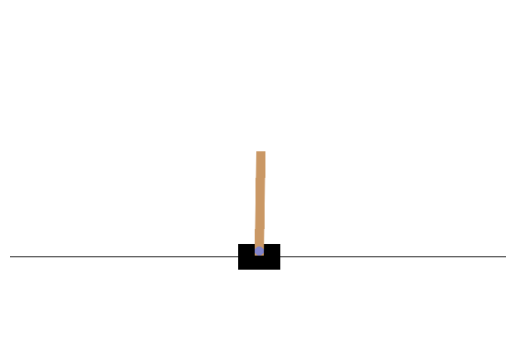

In [140]:
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation

def test_agent(env, q_net, episodes=5, max_steps=500):
    frames = []
    rewards = []

    for ep in range(episodes):
        state, info = env.reset()
        state = torch.as_tensor(state, dtype=torch.float32)
        total_reward = 0

        for step in range(max_steps):
            # Greedy action (no epsilon)
            q_values = q_net(state.unsqueeze(0))
            action = q_values.argmax(-1).item()

            next_state, reward, terminated, truncated, info = env.step(action)
            done = terminated or truncated
            total_reward += reward

            # Save frame for visualization
            frame = env.render()
            frames.append(frame)

            state = torch.as_tensor(next_state, dtype=torch.float32)
            if done:
                break

        rewards.append(total_reward)
        print(f"Test Episode {ep+1}: Reward = {total_reward}")

    return frames, rewards

# Run test
frames, rewards = test_agent(env, target_net)

# Create animation
fig = plt.figure()
plt.axis("off")
im = plt.imshow(frames[0])

def update(i):
    im.set_array(frames[i])
    return [im]

ani = animation.FuncAnimation(fig, update, frames=len(frames), interval=50)
HTML(ani.to_jshtml())


In [141]:
import imageio
import torch

def record_agent(env, q_net, filename="cartpole_dqn.mp4", max_steps=500):
    frames = []
    state, info = env.reset()
    state = torch.as_tensor(state, dtype=torch.float32)

    for step in range(max_steps):
        # Greedy action (no epsilon)
        q_values = q_net(state.unsqueeze(0))
        action = q_values.argmax(-1).item()

        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated

        # Capture frame
        frame = env.render()
        frames.append(frame)

        state = torch.as_tensor(next_state, dtype=torch.float32)
        if done:
            break

    # Save as video
    imageio.mimsave(filename, frames, fps=30)
    print(f"Video saved as {filename}")

# Example usage
record_agent(env, target_net, filename="cartpole_dqn.mp4")


Video saved as cartpole_dqn.mp4
